In [1]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 30.6MB 98kB/s 
     |████████████████████████████████| 20.2MB 106kB/s 
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.18.4
    Uninstalling numpy-1.18.4:
      Successfully uninstalled numpy-1.18.4
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [0]:
# import basic functions
import numpy as np 
import cv2
from google.colab.patches import cv2_imshow

import glob
import os 
import matplotlib.pyplot as plt

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Panorama as a function for dealing with multiple images

In [0]:
def trim(frame):
          #crop top
          if not np.sum(frame[0]):
              return trim(frame[1:])
          #crop bottom
          if not np.sum(frame[-1]):
              return trim(frame[:-2])
          #crop left
          if not np.sum(frame[:,0]):
              return trim(frame[:,1:])
          #crop right
          if not np.sum(frame[:,-1]):
              return trim(frame[:,:-2])
          return frame

def panorama(path_right,path_left):

      image1=cv2.imread(path_right)
      image2=cv2.imread(path_left)

      image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
      image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

      image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
      image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

      # Initiate Sift detector
      sift =cv2.xfeatures2d.SIFT_create()
      kp1, des1 = sift.detectAndCompute(image1_gray,None)
      kp2, des2 = sift.detectAndCompute(image2_gray,None)

      # display the keypoints and features detected on both images
      #fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
      #ax1.imshow(cv2.drawKeypoints(image1_gray,kp1,None,color=(0,255,0)))
      #ax1.set_xlabel("(a)", fontsize=14)
      #ax2.imshow(cv2.drawKeypoints(image2_gray,kp2,None,color=(0,255,0)))
      #ax2.set_xlabel("(b)", fontsize=14)

      match = cv2.BFMatcher()
      matches = match.knnMatch(des1,des2,k=2)

      good = []
      for m,n in matches:
          if m.distance < 0.9*n.distance:
              good.append(m)

      draw_params = dict(matchColor=(0,255,0),
                            singlePointColor=None,
                            flags=2)

      img3 = cv2.drawMatches(image1_gray,kp1,image2_gray,kp2,good,None,**draw_params)
      #plt.imshow(img3)
      
      MIN_MATCH_COUNT = 10
      if len(good) > MIN_MATCH_COUNT:
          src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
          dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

          M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
          print("m is",M)
          h,w = image2_gray.shape
          pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
          dst = cv2.perspectiveTransform(pts, M)
          #img2 = cv2.polylines(image2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

          #plt.imshow(img2)
          dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]+ image1.shape[0]))
          dst[0:image2.shape[0],0:image2.shape[1]] = image2
          #plt.imshow(dst)

          
          #plt.imshow(trim(dst))
          #cv2.imsave("original_image_stitched_crop.jpg", trim(dst))
          return(trim(dst))
          dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]+ image1.shape[0]))
          dst[0:image2.shape[0],0:image2.shape[1]] = image2
          #plt.imshow(dst)

      
          #plt.imshow(trim(dst))
          #cv2.imsave("original_image_stitched_crop.jpg", trim(dst))
          return(trim(dst))
      else:
          print("Not enought matches are found - %d/%d", (len(good)/MIN_MATCH_COUNT))
          return(np.zeros((100,100),dtype=np.uint8))
          



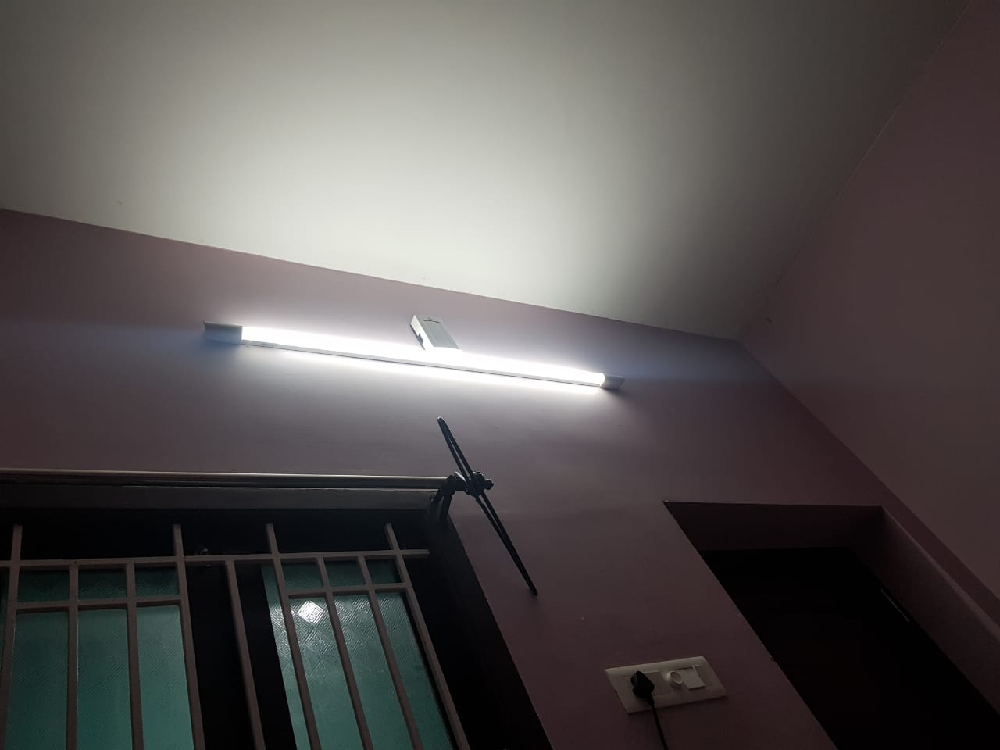

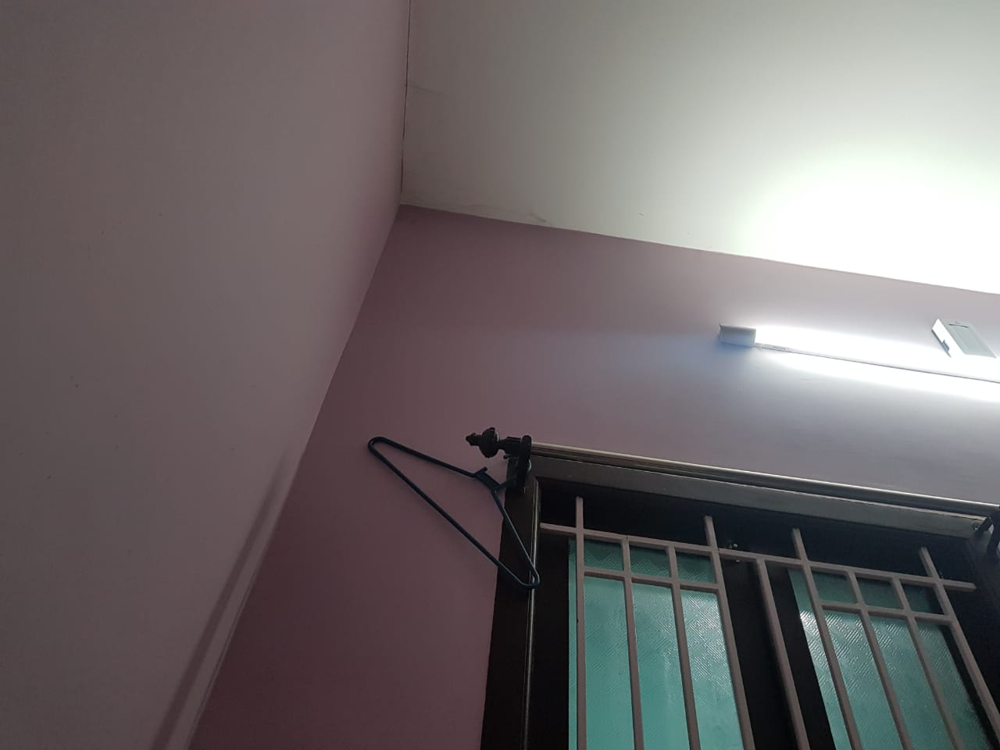

m is [[ 4.16070694e-01  4.04436908e-02  6.88785854e+02]
 [-1.57172269e-01  8.49528727e-01  5.53794907e+01]
 [-4.17198041e-04 -1.84661900e-05  1.00000000e+00]]


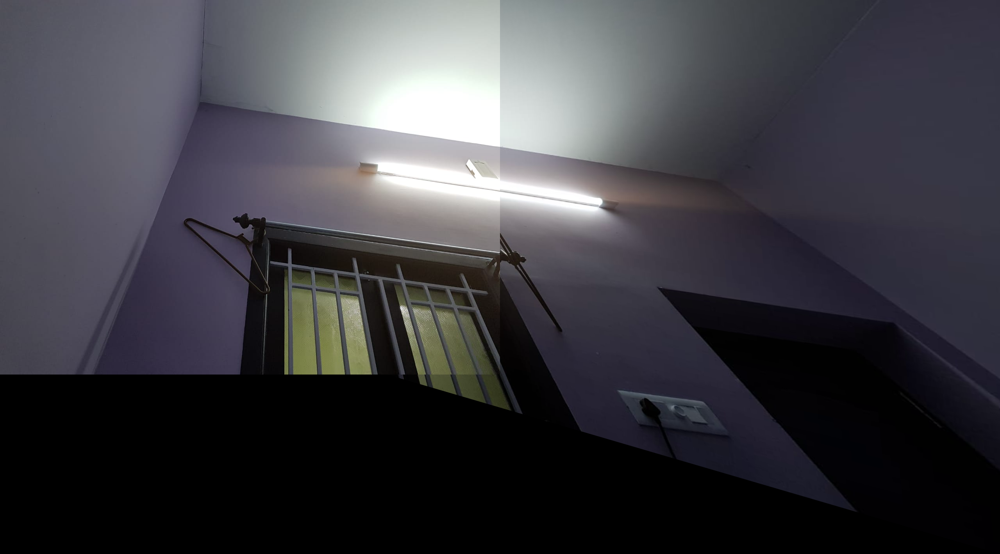

In [26]:
#Images containing the source of light (pic of sun  or your tubelight.)
path1="light1.jpeg"
path2="light2.jpeg"
cv2_imshow(cv2.imread(path1))
cv2_imshow(cv2.imread(path2))
img_new=panorama(path1,path2)
# save_image=save_path+images[i+1][:-4]+"output.png"
  # cv2_imshow(save_image)
# cv2.imwrite(save_image, cv2.cvtColor(img_new, cv2.COLOR_RGB2BGR))
cv2_imshow(img_new)


#Observations:
#The image has been stitched together relatively well. We can clearly see that the line of stitch is
#properly connected.


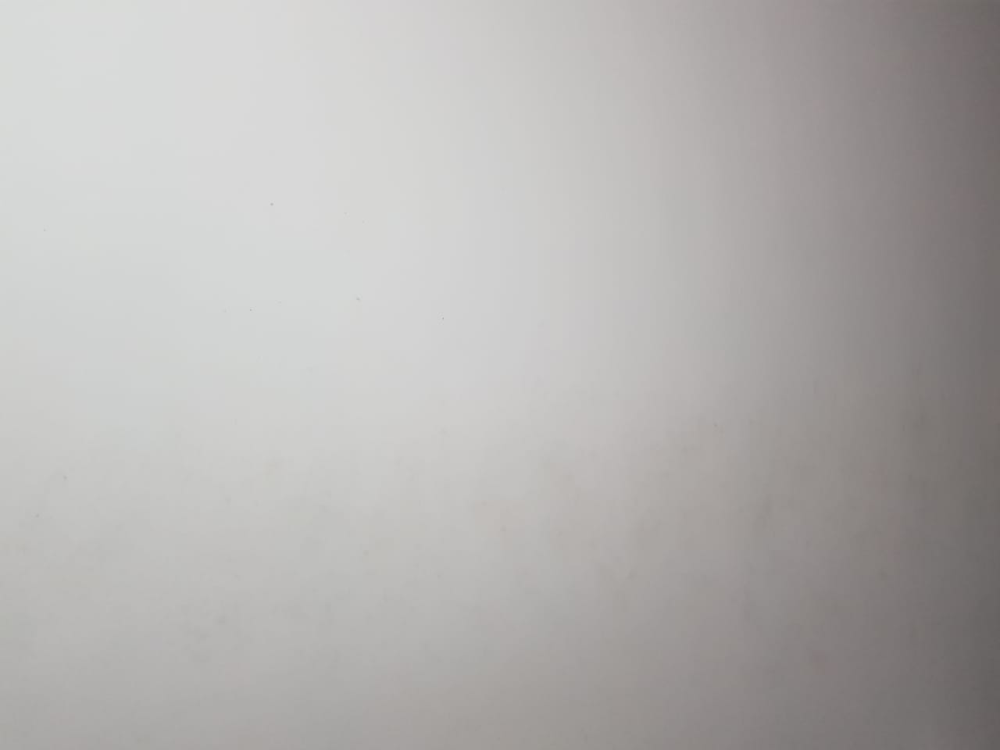

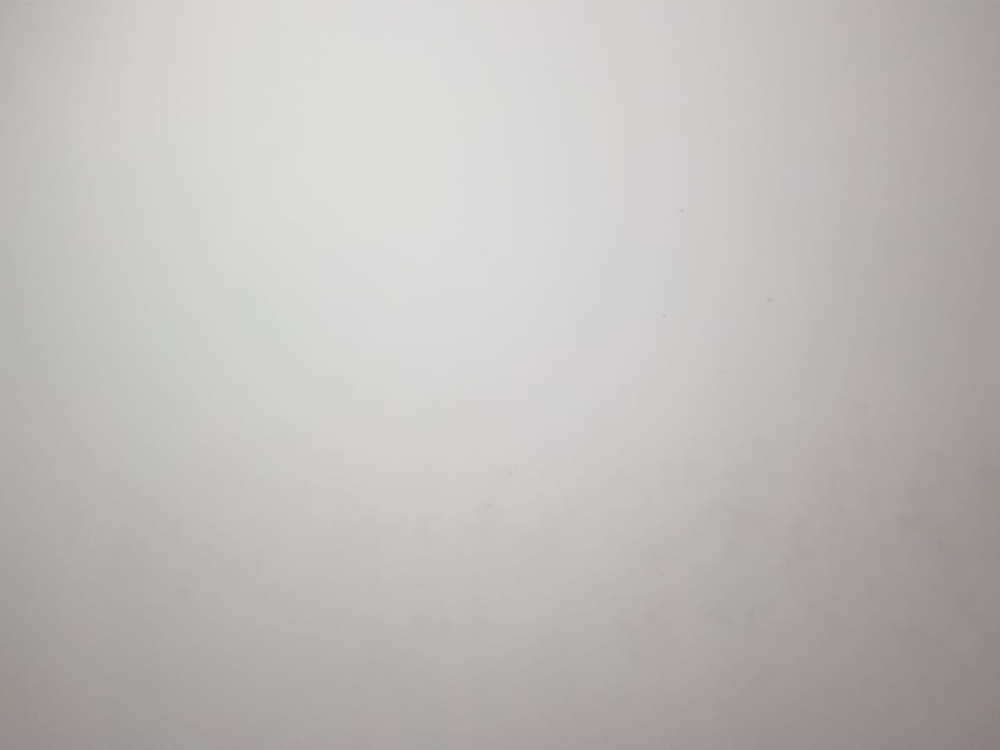

Not enought matches are found - %d/%d 0.0


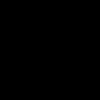

In [27]:
#Images containing wall
path1="wall1.jpeg"
path2="wall2.jpeg"
cv2_imshow(cv2.imread(path1))
cv2_imshow(cv2.imread(path2))
img_new=panorama(path2,path1)
# save_image=save_path+images[i+1][:-4]+"output.png"
  # cv2_imshow(save_image)
# cv2.imwrite(save_image, cv2.cvtColor(img_new, cv2.COLOR_RGB2BGR))
cv2_imshow(img_new)


#Observations: The wall in my room has no distuinguishing features. Thus not enough matching features were found
#and the stitch was unsuccessful.

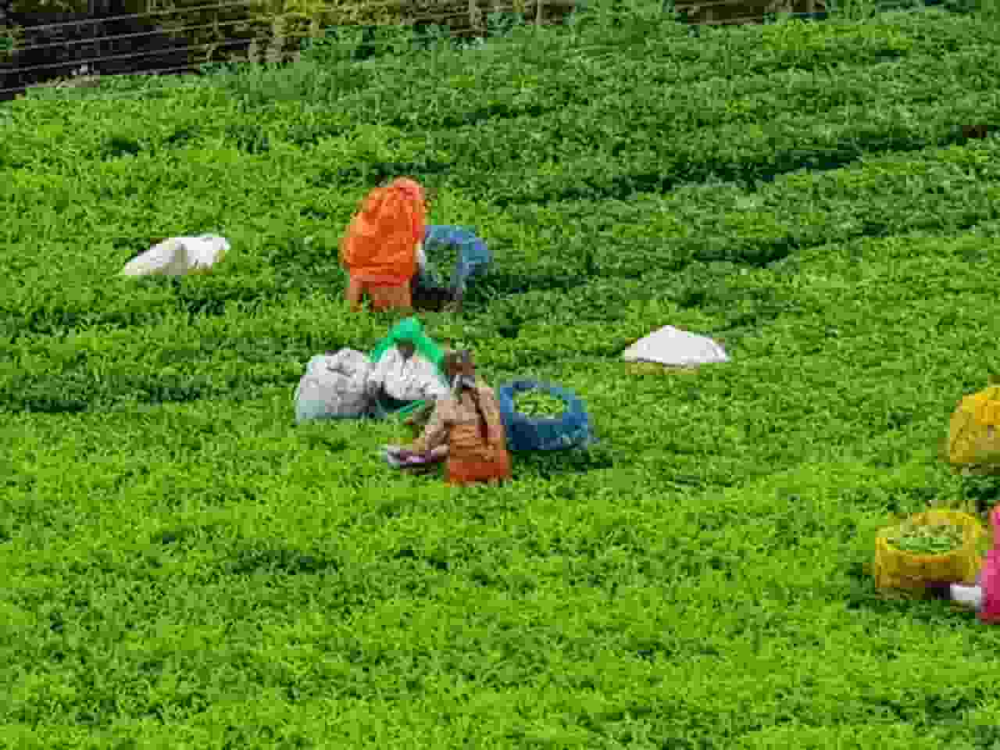

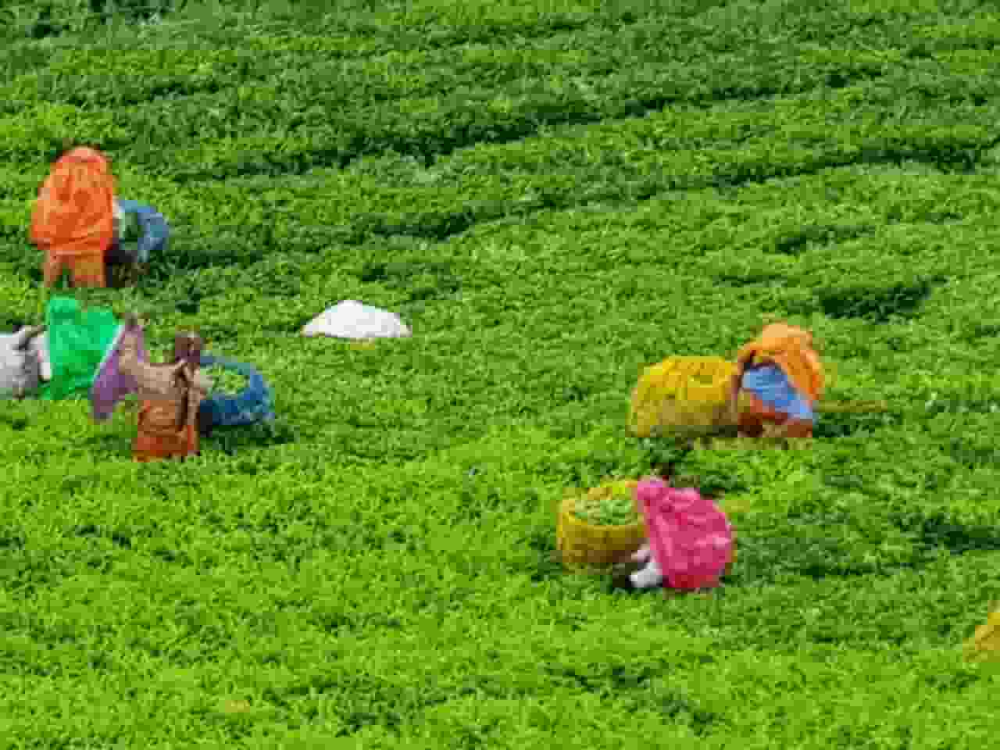

m is [[ 1.00281265e+00 -1.20846659e-02  4.13673422e+02]
 [ 1.23255608e-02  1.00408255e+00  2.61961588e+01]
 [ 1.46134006e-06  9.24243493e-07  1.00000000e+00]]


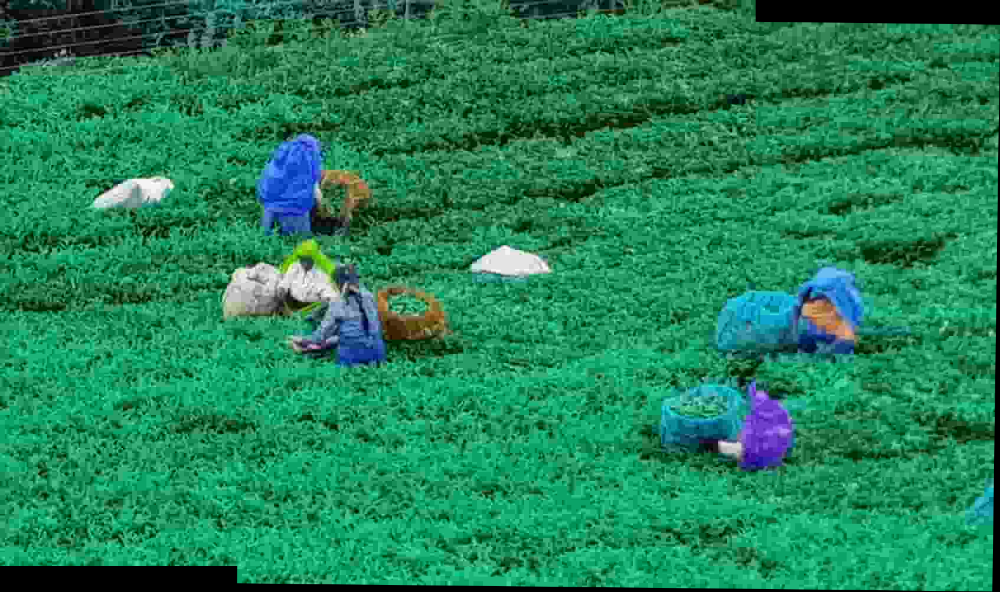

In [28]:
#Image containing a view
path1="view1.jpg"
path2="view2.jpg"
cv2_imshow(cv2.imread(path1))
cv2_imshow(cv2.imread(path2))
img_new=panorama(path2,path1)
# save_image=save_path+images[i+1][:-4]+"output.png"
  # cv2_imshow(save_image)
# cv2.imwrite(save_image, cv2.cvtColor(img_new, cv2.COLOR_RGB2BGR))
cv2_imshow(img_new)

#Observation: This picture of a farming field is bright and has many distinguishing features.Thus, 
#the picture is very well stitched together.

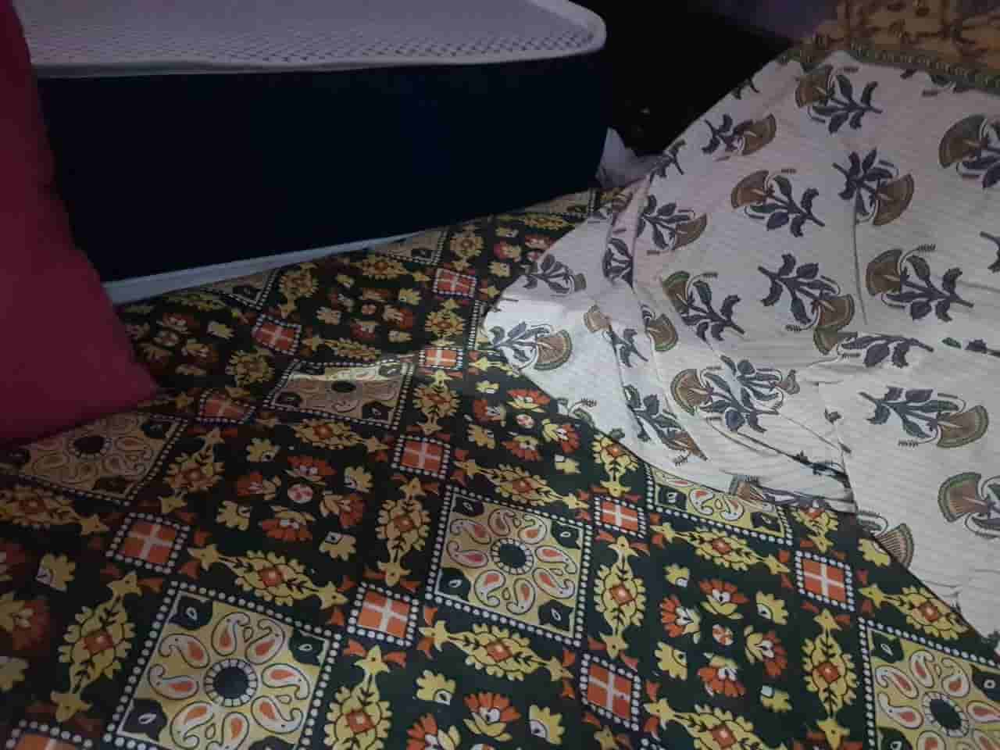

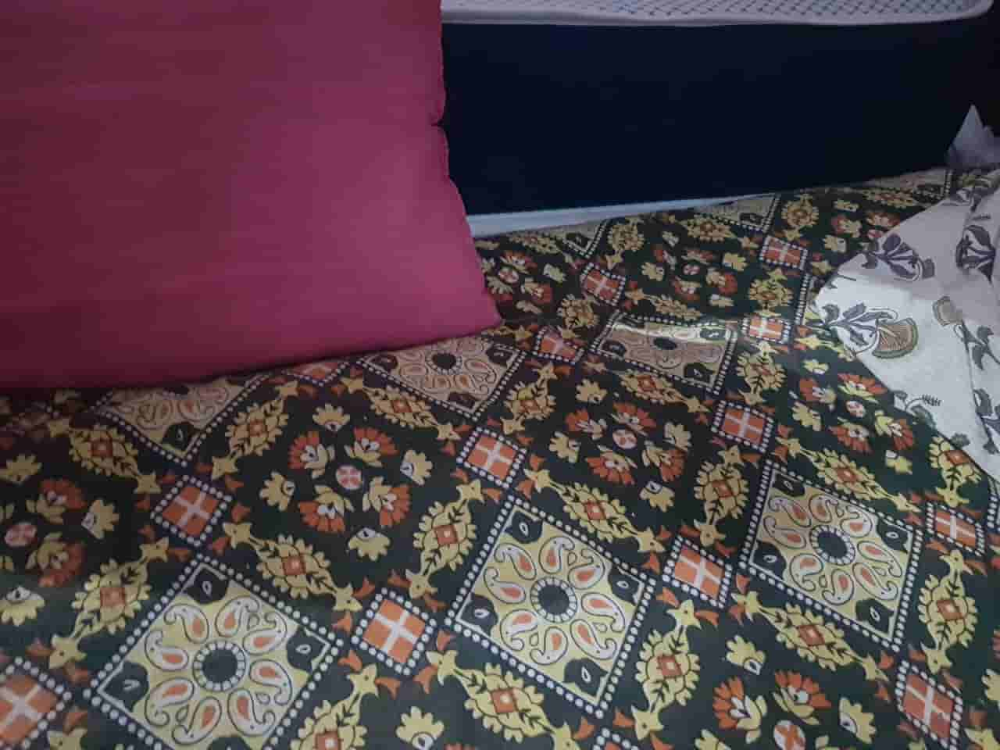

m is [[ 6.56367300e-01  3.88982955e-02  4.80854645e+02]
 [ 1.56983912e-02  9.47304457e-01 -6.98047512e+01]
 [-2.75424946e-04  8.81696171e-05  1.00000000e+00]]


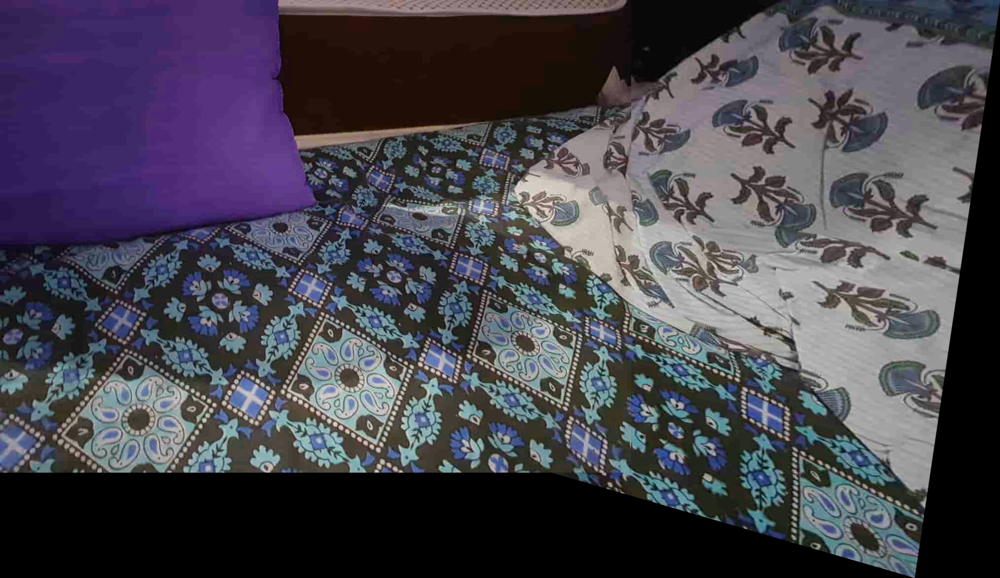

In [29]:
#Images containing dim lighting
path1="dim1-min.jpeg"
path2="dim2-min.jpeg"
cv2_imshow(cv2.imread(path1))
cv2_imshow(cv2.imread(path2))
img_new=panorama(path1,path2)
# save_image=save_path+images[i+1][:-4]+"output.png"
  # cv2_imshow(save_image)
# cv2.imwrite(save_image, cv2.cvtColor(img_new, cv2.COLOR_RGB2BGR))
cv2_imshow(img_new)

#Observation: Even though the lighting is dim, the pictures were stitched together well.

[[318. 263.]
 [524. 376.]
 [310. 660.]
 [ 87. 479.]]
[[  0   0]
 [299   0]
 [299 399]
 [  0 399]]


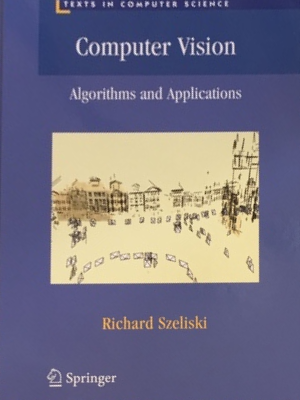

In [21]:
#Task1

import math
import numpy as np
I = cv2.imread('/content/drive/My Drive/Day4 Material/book1.jpg')

pts=np.load("/content/drive/My Drive/Day4 Material/Points.npy")
print(pts)

height,width=400,300
im_dst=np.zeros((height,width,3),dtype=np.uint8)
pts_src=pts

pts_dst=np.array([[0,0],[299,0],[299,399],[0,399]])



print(pts_dst)
h, status = cv2.findHomography(pts, pts_dst)

im_dst=cv2.warpPerspective(I,h,(width,height))
cv2_imshow(im_dst)



# p2=[78,42]
# p1=[95,58]
# a,b,c=I.shape
# myradians = math.degrees(math.atan2(p1[0]-p2[0],p1[1]-p2[1]))
# print(myradians)

# M=cv2.getRotationMatrix2D((b/2,a/2),myradians,1)
# im_scaling=cv2.warpAffine(I,M,(I.shape[1],I.shape[0]))


[[318. 263.]
 [524. 376.]
 [310. 660.]
 [ 87. 479.]]
[[318. 256.]
 [534. 372.]
 [316. 670.]
 [ 73. 473.]]


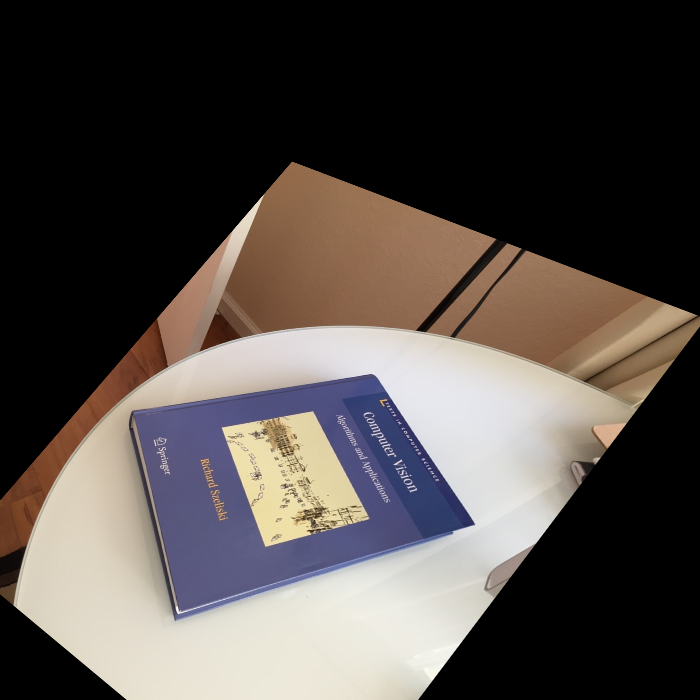

In [22]:
#Task2

I = cv2.imread('/content/drive/My Drive/Day4 Material/book1.jpg')

pts=np.load("/content/drive/My Drive/Day4 Material/Points.npy")
print(pts)

height,width=700,700
im_dst=np.zeros((height,width,3),dtype=np.uint8)
# pts_src=pts

# pts_dst=np.array([[0,0],[299,0],[299,399],[0,399]])

pts_src = np.array([[141, 131], [480, 159], [493, 630],[64, 601]], dtype=float)

pts_dst = np.array([[318, 256],[534, 372],[316, 670],[73, 473]], dtype=float)


print(pts_dst)
h, status = cv2.findHomography(pts_src, pts_dst)

im_dst=cv2.warpPerspective(I,h,(width,height))
cv2_imshow(im_dst)



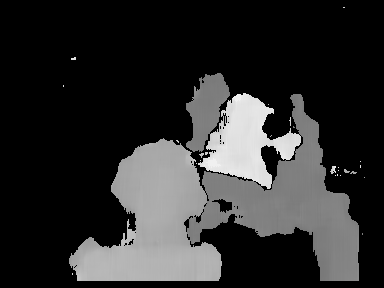

In [20]:
#Task3

imgL = cv2.imread('/content/drive/My Drive/Day4 Material/tsukuba_l.png',cv2.IMREAD_GRAYSCALE)
imgR = cv2.imread('/content/drive/My Drive/Day4 Material/tsukuba_r.png',cv2.IMREAD_GRAYSCALE)

stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = stereo.compute(imgL,imgR)

# cv2_imshow(disparity)


for i in range(len(disparity)):
  for j in range(len(disparity[i])):
    if(disparity[i][j]<120):
      imgL[i][j]=0
      imgR[i][j]=0
      disparity[i][j]=0
cv2_imshow(disparity)

In [31]:
#Task4
#Code takes extremely long to run. runtime: 354*400 (imageL) *200(imageR scanning line length)  * 20 * 20 (patch/window size)
#                                           the first two dimensions can be changed to 20 x 20 to only get the top left part of disparity


imgL = cv2.imread('/content/drive/My Drive/Day4 Material/view0.png',cv2.IMREAD_GRAYSCALE)
imgR = cv2.imread('/content/drive/My Drive/Day4 Material/view1.png',cv2.IMREAD_GRAYSCALE)

print(imgL.shape)
print(imgR.shape)
minval=1000000000
mindist=100000000
height,width=imgL.shape
arr=[]
for i in range(354):
  arr.append([])
  for j in range(400):
    arr[i].append(100000000)


disparity=[]
for i in range(354):
  disparity.append([])
  for j in range(400):
    disparity[i].append(100000000)

def patchdiff(lrow,lcol,rcol,window):
  diff=0
  for k in range(max(0,lrow-window),min(height,lrow+window)):
    for l in range(max(0,rcol-window),min(width,rcol+window)):
      diff+=((int(imgL[lrow][lcol])-int(imgR[k][l]))**2)
  return diff

# mindiff=100000000000
windowsize=10 #patch side length is taken as double of windowsize variable
for i in range(len(imgL)):
  for j in range(len(imgL[i])):
    for k in range(max(0,len(imgR[i])-100,min(width,len(imgR[i])+100))): #scanning line spans 100 pixels to the left and right of the current point
      val=patchdiff(i,j,k,windowsize)
      if(val<arr[i][j]):
        arr[i][j]=val
        disparity[i][j]=(abs(int(k)-int(j))/10)*255

cv2_imshow(imgL)
cv2_imshow(imgR)
cv2_imshow(np.array(disparity,np.uint8))

(354, 400)
(354, 400)


KeyboardInterrupt: ignored